In [1]:
import gradio
import matplotlib.pyplot as plt

from pathlib import Path
#import polars as pl
import pandas as pd

import streamlit as st

/Users/kou_murase/workspace/nlp_workspace/llm_competition/SIGNATE_rag1/llm-env/lib/python3.9/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
df = pd.read_csv("/Users/kou_murase/workspace/kaggle_CMI/input/parquet_exist.csv")

In [3]:
df

,id,Basic_Demos-Age,Basic_Demos-Sex,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,...,PCIAT-PCIAT_Total,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-computerinternet_hoursday,sii,parquet_data_exist,file_num,file_of_length,non-wear_length,percent_non-wear_length
0,00115b9f,9,0,71.0,18.292347,56.00,81.6,NaN,60.0,97.0,...,44.0,31.0,45.0,0.0,1.0,True,1,43330,0,0.000000
1,001f3379,13,1,50.0,22.279952,59.50,112.2,NaN,60.0,73.0,...,34.0,40.0,56.0,0.0,1.0,True,1,396396,252760,0.637645
2,00f332d1,14,0,68.0,17.168636,66.50,108.0,NaN,60.0,71.0,...,47.0,30.0,43.0,2.0,1.0,True,1,414384,68545,0.165414
3,01085eb3,12,0,58.0,34.187282,60.50,178.0,NaN,67.0,81.0,...,30.0,53.0,73.0,0.0,0.0,True,1,370956,12793,0.034487
4,012cadd8,9,0,60.0,17.089151,53.20,68.8,NaN,62.0,88.0,...,9.0,27.0,40.0,0.0,0.0,True,1,97048,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,fe9c71d8,9,0,80.0,15.891137,56.75,72.8,NaN,44.0,65.0,...,29.0,33.0,47.0,0.0,0.0,True,1,426684,55612,0.130335
992,fecc07d6,7,0,85.0,15.986589,49.00,54.6,NaN,59.0,80.0,...,14.0,34.0,49.0,0.0,0.0,True,1,414300,384684,0.928516
993,ff18b749,7,0,NaN,14.768842,47.50,47.4,NaN,58.0,99.0,...,0.0,62.0,85.0,0.0,0.0,True,1,384900,0,0.000000
994,ffcd4dbd,11,0,68.0,21.441500,60.00,109.8,NaN,79.0,99.0,...,31.0,56.0,77.0,0.0,1.0,True,1,416275,7744,0.018603


In [4]:
describe_df = df["file_of_length"].describe()
describe_df#["value"]#*5

count       996.000000
mean     315832.478916
std      133011.574731
min         927.000000
25%      253592.750000
50%      383544.000000
75%      402597.000000
max      756212.000000
Name: file_of_length, dtype: float64

In [5]:
df["id"][2]

'00f332d1'

In [6]:
parq_dir = Path("../input/series_train.parquet/")
_id = "00115b9f"

In [7]:
!ls

sample-Copy1.ipynb sample.ipynb


In [8]:
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

In [9]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
0,0,0.021536,0.022214,-1.022370,0.022853,-88.280762,0.0,53.000000,4188.000000,56940000000000,4,3,41.0
1,1,0.022005,0.022187,-1.019740,0.020231,-88.241707,0.0,51.666668,4188.166504,56945000000000,4,3,41.0
2,2,0.022240,0.022005,-1.019401,0.019893,-88.170067,0.0,50.333332,4188.333496,56950000000000,4,3,41.0
3,3,0.021589,0.022578,-1.018177,0.018667,-88.250031,0.0,50.500000,4188.500000,56955000000000,4,3,41.0
4,4,0.022005,0.023763,-1.014323,0.016848,-88.130775,0.0,33.166668,4181.000000,57235000000000,4,3,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43325,43325,-0.008333,-0.023620,-1.006901,0.007224,-88.595741,0.0,0.000000,3824.000000,57580000000000,6,3,85.0
43326,43326,0.048730,-0.076725,-0.953776,0.056839,-85.352219,0.0,0.000000,3824.000000,57640000000000,6,3,85.0
43327,43327,0.387370,0.793151,-0.402214,0.069961,-24.097908,0.0,0.000000,3824.000000,57645000000000,6,3,85.0
43328,43328,0.801953,0.501589,-0.040937,0.045489,-2.113776,0.0,0.000000,3824.000000,57650000000000,6,3,85.0


In [10]:
enmo_non_zero = sample[sample["enmo"]!=0]
enmo_non_zero

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
0,0,0.021536,0.022214,-1.022370,0.022853,-88.280762,0.0,53.000000,4188.000000,56940000000000,4,3,41.0
1,1,0.022005,0.022187,-1.019740,0.020231,-88.241707,0.0,51.666668,4188.166504,56945000000000,4,3,41.0
2,2,0.022240,0.022005,-1.019401,0.019893,-88.170067,0.0,50.333332,4188.333496,56950000000000,4,3,41.0
3,3,0.021589,0.022578,-1.018177,0.018667,-88.250031,0.0,50.500000,4188.500000,56955000000000,4,3,41.0
4,4,0.022005,0.023763,-1.014323,0.016848,-88.130775,0.0,33.166668,4181.000000,57235000000000,4,3,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43325,43325,-0.008333,-0.023620,-1.006901,0.007224,-88.595741,0.0,0.000000,3824.000000,57580000000000,6,3,85.0
43326,43326,0.048730,-0.076725,-0.953776,0.056839,-85.352219,0.0,0.000000,3824.000000,57640000000000,6,3,85.0
43327,43327,0.387370,0.793151,-0.402214,0.069961,-24.097908,0.0,0.000000,3824.000000,57645000000000,6,3,85.0
43328,43328,0.801953,0.501589,-0.040937,0.045489,-2.113776,0.0,0.000000,3824.000000,57650000000000,6,3,85.0


In [11]:
sample[sample["enmo"]==0]

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
61,61,-0.893880,0.107292,0.370937,0.0,22.422384,0.0,3.100000,4181.0,57555000000000,4,3,41.0
66,66,-0.690547,0.040729,0.673177,0.0,44.263309,0.0,7.433333,4181.0,57580000000000,4,3,41.0
245,245,-0.571458,-0.361120,-0.705521,0.0,-46.285225,0.0,42.750000,4181.0,58475000000000,4,3,41.0
246,246,-0.583802,-0.343203,-0.703828,0.0,-46.088989,0.0,29.000000,4181.0,58480000000000,4,3,41.0
247,247,-0.583516,-0.347813,-0.702422,0.0,-45.980530,0.0,33.400002,4181.0,58485000000000,4,3,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43228,43228,-0.317839,0.089844,0.926641,0.0,70.421471,0.0,10.931061,3829.0,59665000000000,5,3,84.0
43229,43229,-0.318229,0.089670,0.926215,0.0,70.296303,0.0,10.933818,3829.0,59670000000000,5,3,84.0
43236,43236,-0.286302,0.029870,0.938516,0.0,73.006866,0.0,2.148148,3829.0,59820000000000,5,3,84.0
43238,43238,-0.254870,0.036901,0.950130,0.0,74.886978,0.0,5.907407,3829.0,59855000000000,5,3,84.0


enmoでdiffとって前の時間との差分がない（同じ"動き"をしていて、かつ、enmo=0の動いていない区間を見たい）

In [15]:
enmo_diff = sample["enmo"].diff()
enmo_diff

0             NaN
1       -0.002621
2       -0.000339
3       -0.001226
4       -0.001819
           ...   
43325    0.000107
43326    0.049615
43327    0.013122
43328   -0.024472
43329    0.017614
Name: enmo, Length: 43330, dtype: float32

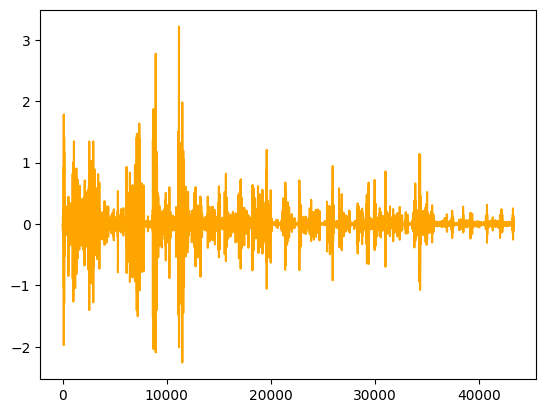

In [17]:
plt.plot(enmo_diff, color="orange")
plt.show()

In [74]:
sample.columns

Index(['step', 'X', 'Y', 'Z', 'enmo', 'anglez', 'non-wear_flag', 'light',
       'battery_voltage', 'time_of_day', 'weekday', 'quarter',
       'relative_date_PCIAT'],
      dtype='object')

In [76]:
len(sample.columns)

13

In [101]:
def plot_xyz(sample, title):
    fig, ax = plt.subplots(13, 1, figsize=(35, 30))

    enmo_non_zero = sample[sample["enmo"]!=0]
    ax[0].plot(enmo_non_zero["step"], enmo_non_zero["X"], color="orange")
    enmo_zero = sample[sample["enmo"]==0]
    ax[0].plot(enmo_zero["step"], enmo_zero["X"], color="blue")
    ax[0].set_title("X")
    
    ax[1].plot(sample["Y"])
    ax[1].set_title("Y")
    
    ax[2].plot(sample["Z"])
    ax[2].set_title("Z")

    ax[3].plot(sample["enmo"])
    ax[3].set_title("enmo")

    ax[4].plot(sample["anglez"])
    ax[4].set_title("anglez")

    ax[5].plot(sample["non-wear_flag"])
    ax[5].set_title("non-wear_flag")
    
    ax[6].plot(sample["light"])
    ax[6].set_title("light")
    
    ax[7].plot(sample["battery_voltage"])
    ax[7].set_title("battery_voltage")

    ax[8].plot(sample["time_of_day"])
    ax[8].set_title("time_of_day")

    ax[9].plot(sample["weekday"])
    ax[9].set_title("weekday")

    ax[10].plot(sample["quarter"])
    ax[10].set_title("quarter")

    ax[11].plot(sample["relative_date_PCIAT"])
    ax[11].set_title("relative_date_PCIAT")

    ax[12].plot(sample["step"])
    ax[12].set_title("step")

    fig.suptitle(title)
    plt.show()

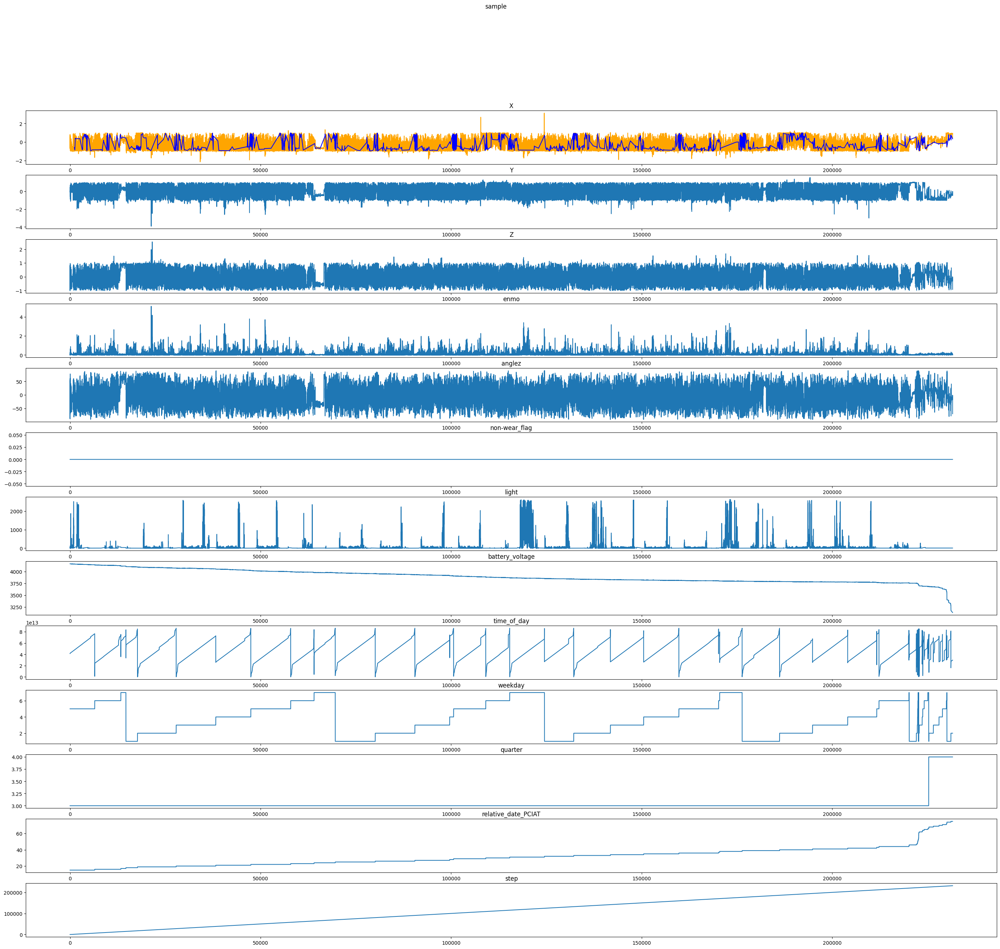

In [102]:
plot_xyz(sample=sample, title="sample")

non wear flagが1の時は、0埋めとかをするべきかもな

In [103]:
df

,id,Basic_Demos-Age,Basic_Demos-Sex,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,...,PCIAT-PCIAT_Total,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-computerinternet_hoursday,sii,parquet_data_exist,file_num,file_of_length,non-wear_length,percent_non-wear_length
0,00115b9f,9,0,71.0,18.292347,56.00,81.6,NaN,60.0,97.0,...,44.0,31.0,45.0,0.0,1.0,True,1,43330,0,0.000000
1,001f3379,13,1,50.0,22.279952,59.50,112.2,NaN,60.0,73.0,...,34.0,40.0,56.0,0.0,1.0,True,1,396396,252760,0.637645
2,00f332d1,14,0,68.0,17.168636,66.50,108.0,NaN,60.0,71.0,...,47.0,30.0,43.0,2.0,1.0,True,1,414384,68545,0.165414
3,01085eb3,12,0,58.0,34.187282,60.50,178.0,NaN,67.0,81.0,...,30.0,53.0,73.0,0.0,0.0,True,1,370956,12793,0.034487
4,012cadd8,9,0,60.0,17.089151,53.20,68.8,NaN,62.0,88.0,...,9.0,27.0,40.0,0.0,0.0,True,1,97048,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,fe9c71d8,9,0,80.0,15.891137,56.75,72.8,NaN,44.0,65.0,...,29.0,33.0,47.0,0.0,0.0,True,1,426684,55612,0.130335
992,fecc07d6,7,0,85.0,15.986589,49.00,54.6,NaN,59.0,80.0,...,14.0,34.0,49.0,0.0,0.0,True,1,414300,384684,0.928516
993,ff18b749,7,0,NaN,14.768842,47.50,47.4,NaN,58.0,99.0,...,0.0,62.0,85.0,0.0,0.0,True,1,384900,0,0.000000
994,ffcd4dbd,11,0,68.0,21.441500,60.00,109.8,NaN,79.0,99.0,...,31.0,56.0,77.0,0.0,1.0,True,1,416275,7744,0.018603


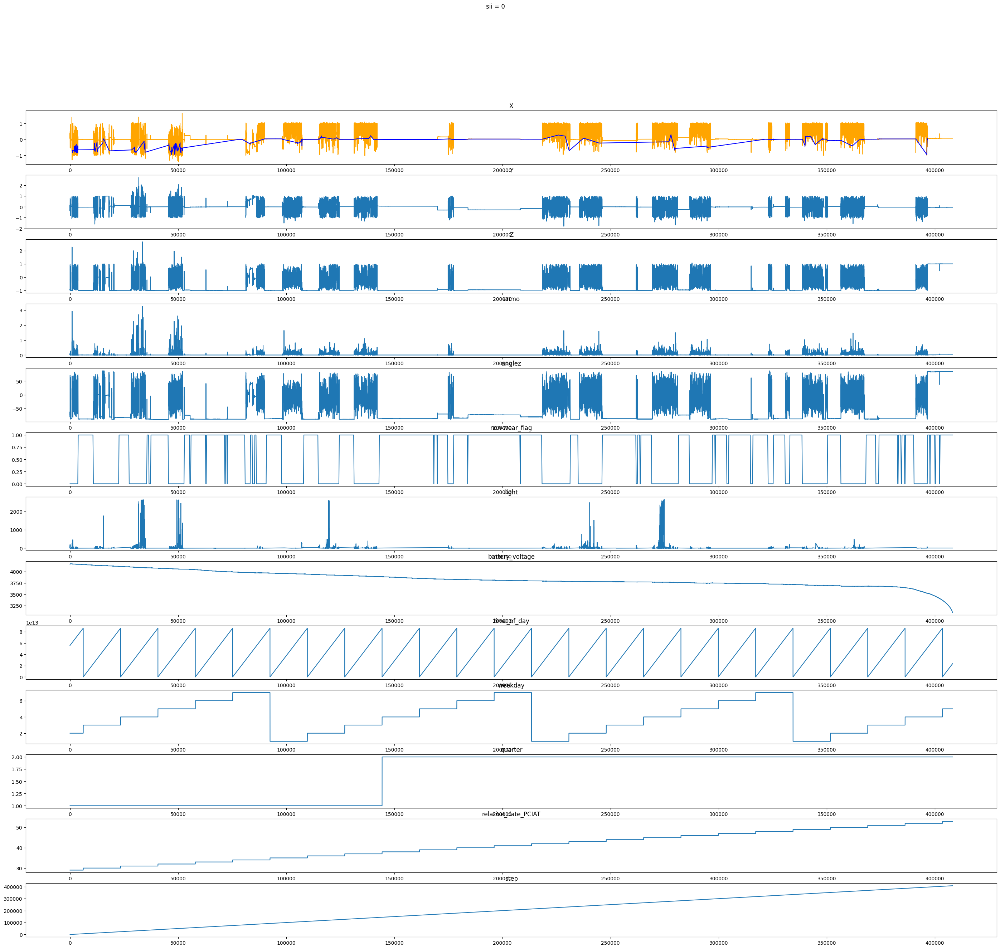

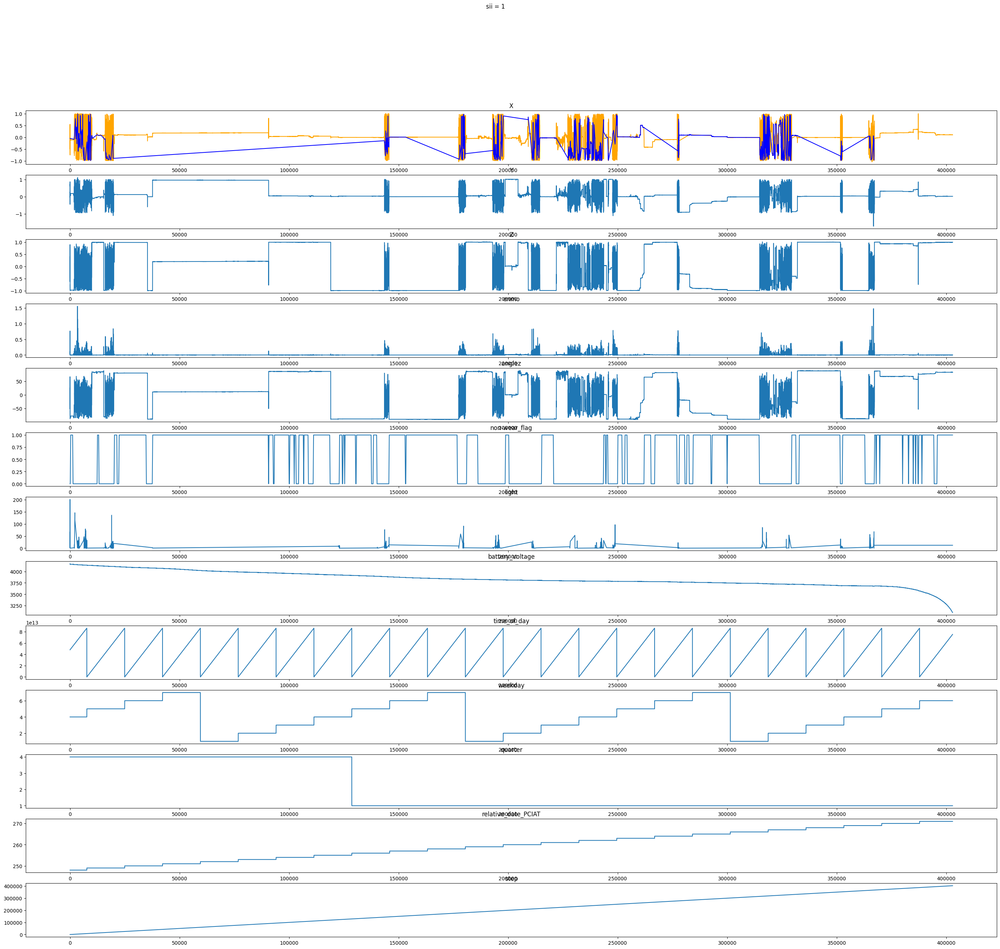

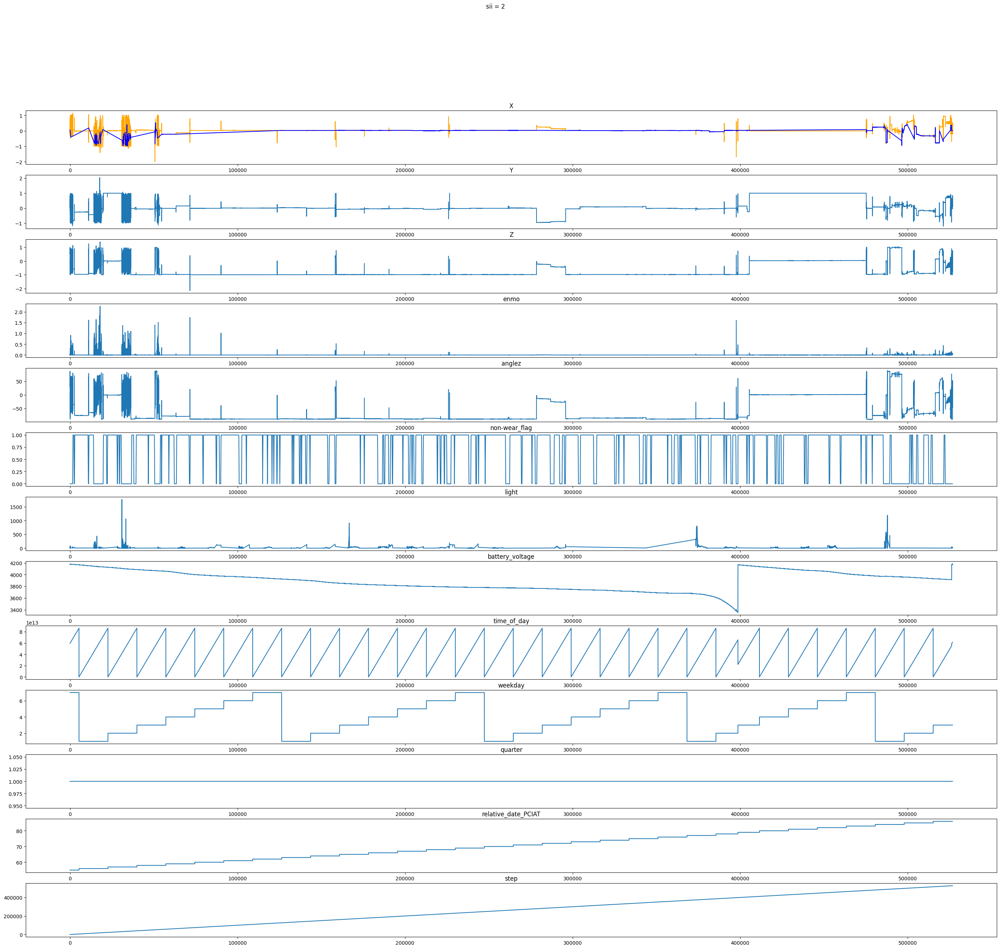

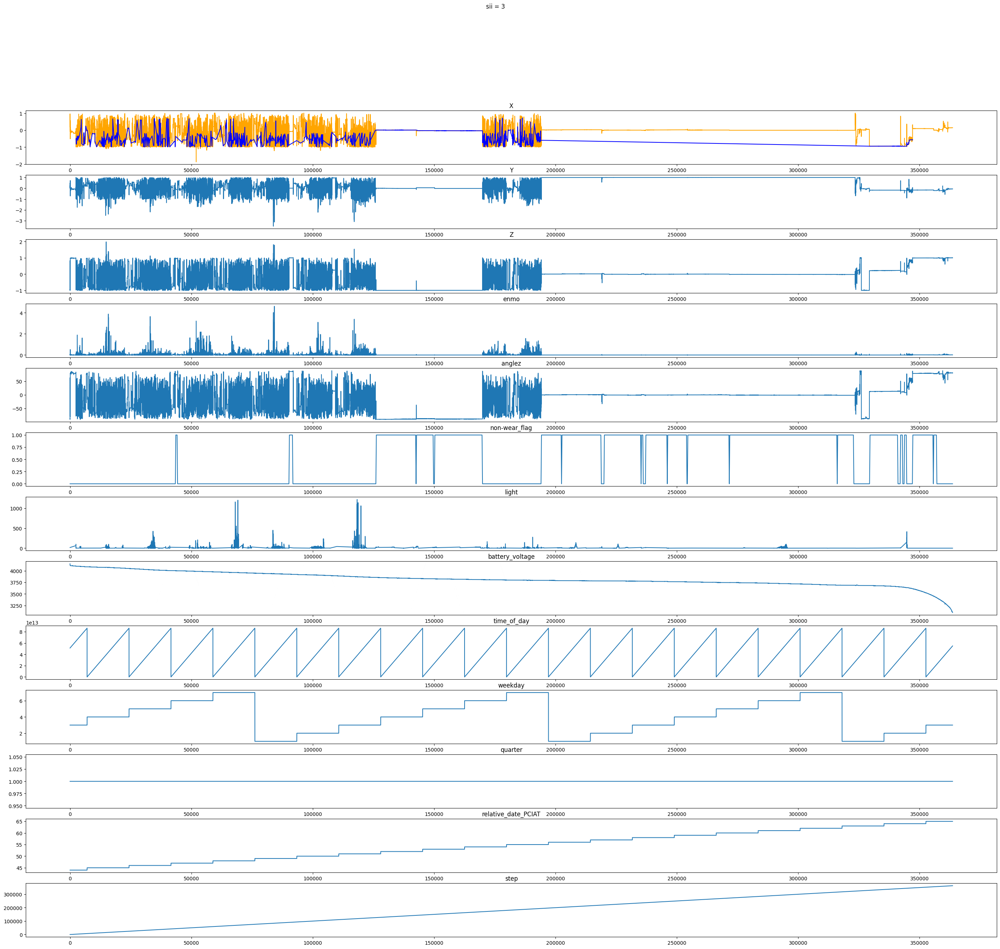

In [104]:
for i in [0, 1, 2, 3]:
    filtered_df = df[df["sii"] == i].sample(1)

    _id = filtered_df["id"].values[0]
    sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
    
    plot_xyz(sample=sample, title=f"sii = {i}")

In [105]:
sample[sample["non-wear_flag"]==1].shape[0] / sample.shape[0]

0.5222950080302731

non_wear_flagがほぼ1の被験者と、ほぼ暗がりにいる人がいる可能性がある。

そのため、そういった人のデータはparquetを学習データとする場合に、学習データから除外する。

In [106]:
for i in range(len(df[df["parquet_data_exist"]])):
    _id = df.loc[i, "id"]
    sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
    break

In [107]:
val

'00115b9f'

In [108]:
sample["light"].mean()

42.29631

light mean 67.79815
sii 1.0


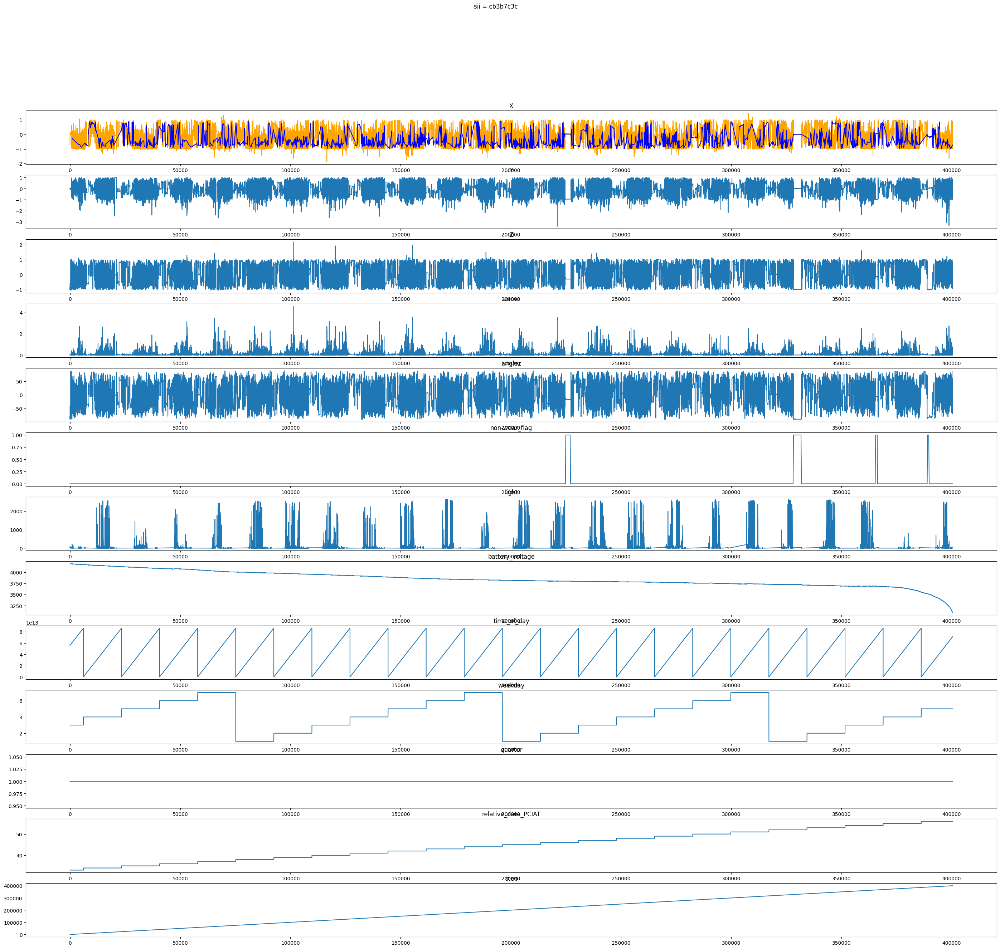

In [109]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

print("light mean", sample["light"].mean())

print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")

860f4f9c
light mean 124.02869
sii 2.0


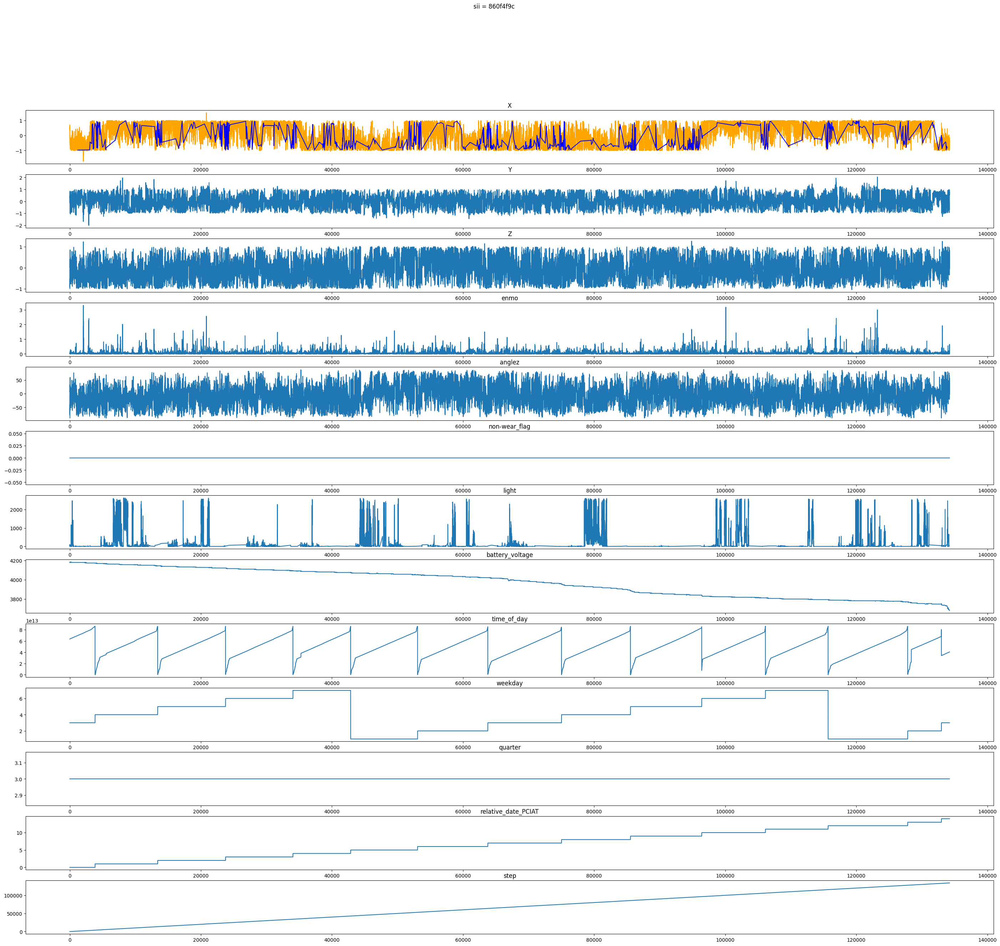

In [110]:
_id = df.sample(1)["id"].values[0]
print(_id)
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

print("light mean", sample["light"].mean())

print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")

In [111]:
sample["quarter"].unique()

array([3], dtype=int8)

(array([9.0385e+04, 1.3345e+04, 8.0080e+03, 4.6110e+03, 1.6240e+03,
        1.0580e+03, 1.7960e+03, 6.2500e+02, 5.6000e+02, 4.4600e+02,
        3.8600e+02, 3.8900e+02, 3.6000e+02, 3.6000e+02, 3.4800e+02,
        3.0800e+02, 2.9200e+02, 2.6200e+02, 2.3900e+02, 2.2900e+02,
        2.4500e+02, 2.1300e+02, 1.8700e+02, 1.7400e+02, 1.8600e+02,
        1.7100e+02, 1.5100e+02, 1.6400e+02, 1.6400e+02, 1.2600e+02,
        1.3800e+02, 1.7000e+02, 1.4400e+02, 1.3800e+02, 1.7700e+02,
        1.6000e+02, 1.5000e+02, 1.5700e+02, 1.4800e+02, 1.2800e+02,
        1.3300e+02, 1.4400e+02, 1.1700e+02, 1.3000e+02, 1.0900e+02,
        1.0500e+02, 9.9000e+01, 8.3000e+01, 9.0000e+01, 8.2000e+01,
        8.7000e+01, 9.1000e+01, 8.3000e+01, 9.2000e+01, 8.9000e+01,
        7.6000e+01, 9.5000e+01, 8.7000e+01, 8.9000e+01, 8.2000e+01,
        6.5000e+01, 6.2000e+01, 7.0000e+01, 7.6000e+01, 7.3000e+01,
        8.2000e+01, 6.5000e+01, 8.4000e+01, 6.8000e+01, 6.7000e+01,
        6.1000e+01, 6.8000e+01, 8.4000e+01, 6.50

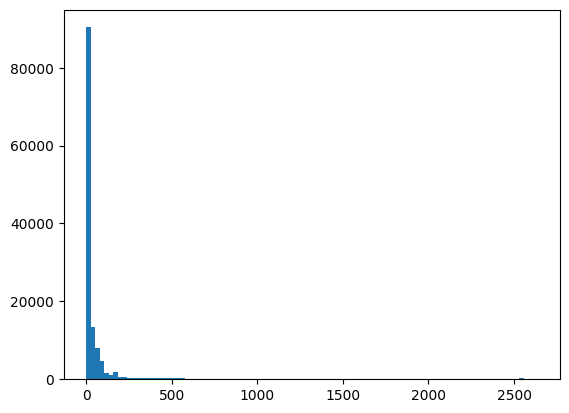

In [114]:
plt.hist(sample["light"], bins=100)

##parcentileで行うと人の家によってびん幅が変わるからよくない

Illuminance (lux)	Surfaces illuminated by
0.0001	Moonless, overcast night sky (starlight)[5]
0.002	Moonless clear night sky with airglow[5]
0.05–0.3	Full moon on a clear night[6]
3.4	Dark limit of civil twilight under a clear sky[7]
20–50	Public areas with dark surroundings[8]
50	Family living room lights (Australia, 1998)[9]
80	Office building hallway/toilet lighting[10][11]
100	Very dark overcast day[5]
150	Train station platforms[12]
320–500	Office lighting[9][13][14][15]
400	Sunrise or sunset on a clear day.
1000	Overcast day;[5] typical TV studio lighting
10,000–25,000	Full daylight (not direct sun)[5]
32,000–100,000	Direct sunlight

#https://actigraphcorp.my.site.com/support/s/article/Lux-Measurements

#luxでびん幅を決める
#例えば0~1の間での活動量など

In [118]:
def filter_by_non_wear_flag(sample):
    return sample[sample["non-wear_flag"]==0]

In [119]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT
0,0,-0.513502,0.758292,0.024830,0.037637,6.945554,0.0,19.50,4183.00,63600000000000,3,3,0.0
1,1,-0.491817,0.286499,0.014584,0.061815,6.174081,0.0,48.00,4182.75,63605000000000,3,3,0.0
2,2,-0.109703,-0.168170,0.353721,0.062916,24.588760,0.0,76.50,4182.50,63610000000000,3,3,0.0
3,3,0.584034,-0.127167,0.413196,0.048219,33.082039,0.0,105.00,4182.25,63615000000000,3,3,0.0
4,4,0.108187,-0.090470,-0.108552,0.054371,-17.595478,0.0,63.25,4182.00,63620000000000,3,3,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
134227,134227,-0.450839,0.523492,0.451398,0.653215,23.913805,0.0,22.00,3679.00,40565000000000,3,3,14.0
134228,134228,-0.511188,0.815877,0.206894,0.019862,13.354355,0.0,22.00,3679.00,40570000000000,3,3,14.0
134229,134229,-0.400735,0.928648,0.018693,0.014179,0.997023,0.0,22.00,3679.00,40575000000000,3,3,14.0
134230,134230,-0.362097,0.943270,0.004234,0.012061,0.321279,0.0,22.00,3679.00,40580000000000,3,3,14.0


Illuminance (lux)	Surfaces illuminated by  
0.0001	Moonless, overcast night sky (starlight)[5]  
0.002	Moonless clear night sky with airglow[5]  
0.05–0.3	Full moon on a clear night[6]  
3.4	Dark limit of civil twilight under a clear sky[7]  
20–50	Public areas with dark surroundings[8]  
50	Family living room lights (Australia, 1998)[9]  
80	Office building hallway/toilet lighting[10][11]  
100	Very dark overcast day[5]  
150	Train station platforms[12]  
320–500	Office lighting[9][13][14][15]  
400	Sunrise or sunset on a clear day.  
1000	Overcast day;[5] typical TV studio lighting  
10,000–25,000	Full daylight (not direct sun)[5]  
32,000–100,000	Direct sunlight  

In [134]:
def plot_lux_line(sample):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    
    sample.light.plot(kind="hist", ax=ax[0])
    sample.light.plot(kind="hist", ax=ax[1])
    
    ax[0].vlines(0.0001, ymin=0, ymax=200000, color="red")
    ax[0].vlines(0.002, ymin=0, ymax=200000, color="red")
    ax[0].vlines(0.05, ymin=0, ymax=200000, color="red")
    ax[0].vlines(0.3, ymin=0, ymax=200000, color="red")
    ax[0].vlines(3.4, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(20, ymin=0, ymax=200000, color="red")
    ax[0].vlines(50, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(80, ymin=0, ymax=200000, color="red")
    ax[0].vlines(50, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(100, ymin=0, ymax=200000, color="red")
    ax[0].vlines(150, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(320, ymin=0, ymax=200000, color="red")
    ax[0].vlines(500, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(400, ymin=0, ymax=200000, color="red")
    
    ax[0].vlines(1000, ymin=0, ymax=200000, color="red")
    
    # ax[0].vlines(32000, ymin=0, ymax=200000, color="red")
    # ax[0].vlines(100000, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(0.0001, ymin=0, ymax=200000, color="red")
    ax[1].vlines(0.002, ymin=0, ymax=200000, color="red")
    ax[1].vlines(0.05, ymin=0, ymax=200000, color="red")
    ax[1].vlines(0.3, ymin=0, ymax=200000, color="red")
    ax[1].vlines(3.4, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(20, ymin=0, ymax=200000, color="red")
    ax[1].vlines(50, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(80, ymin=0, ymax=200000, color="red")
    ax[1].vlines(50, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(100, ymin=0, ymax=200000, color="red")
    ax[1].vlines(150, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(320, ymin=0, ymax=200000, color="red")
    ax[1].vlines(500, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(400, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(1000, ymin=0, ymax=200000, color="red")
    
    ax[1].vlines(32000, ymin=0, ymax=200000, color="red")
    ax[1].vlines(100000, ymin=0, ymax=200000, color="red")

light mean 36.80421
sii 0.0


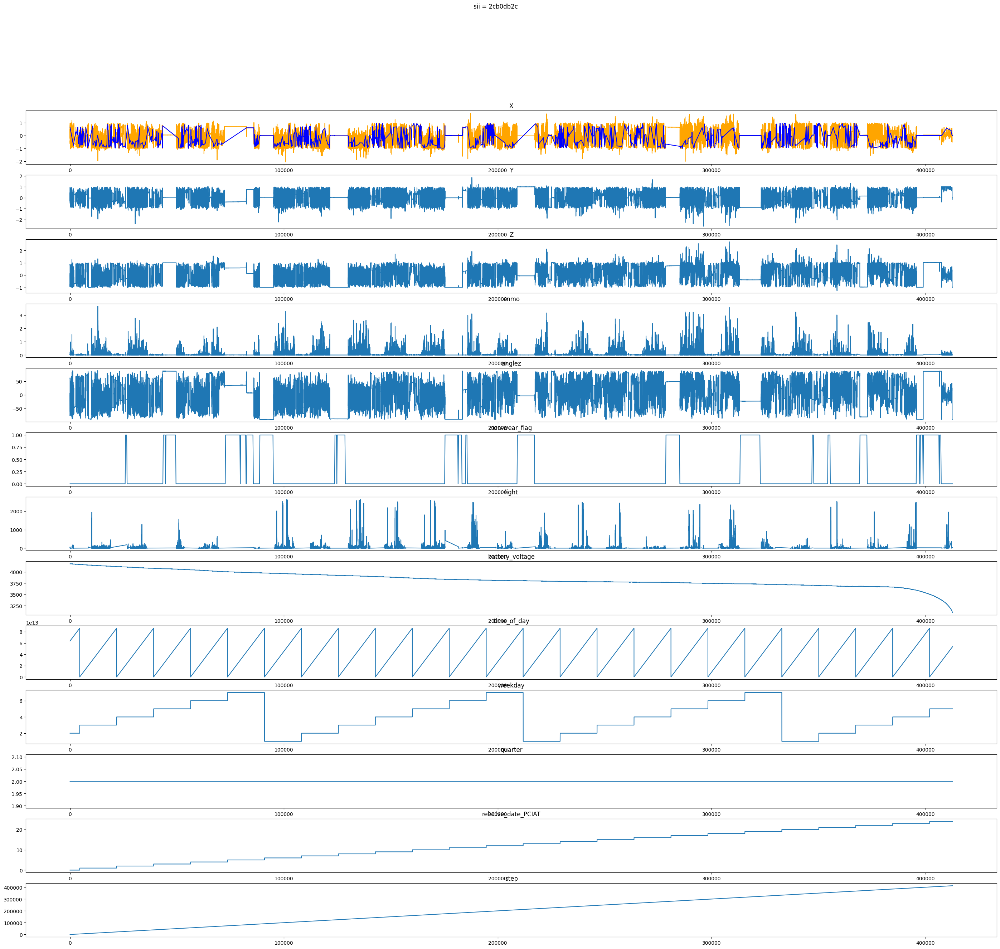

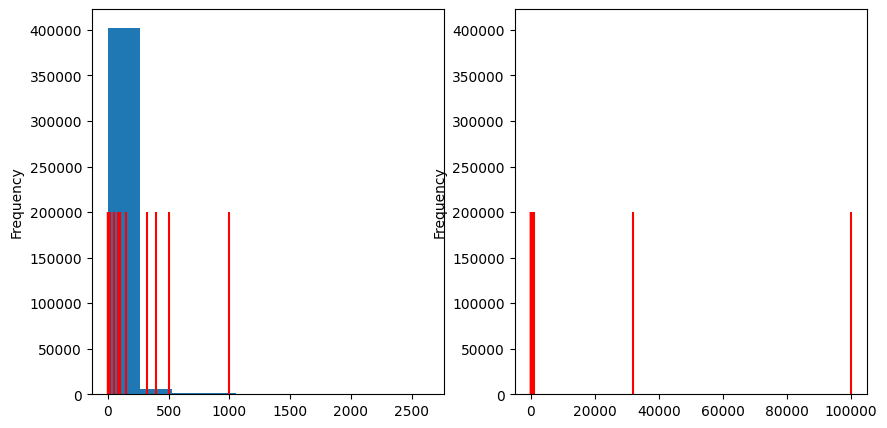

In [135]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 48.619797
sii 0.0


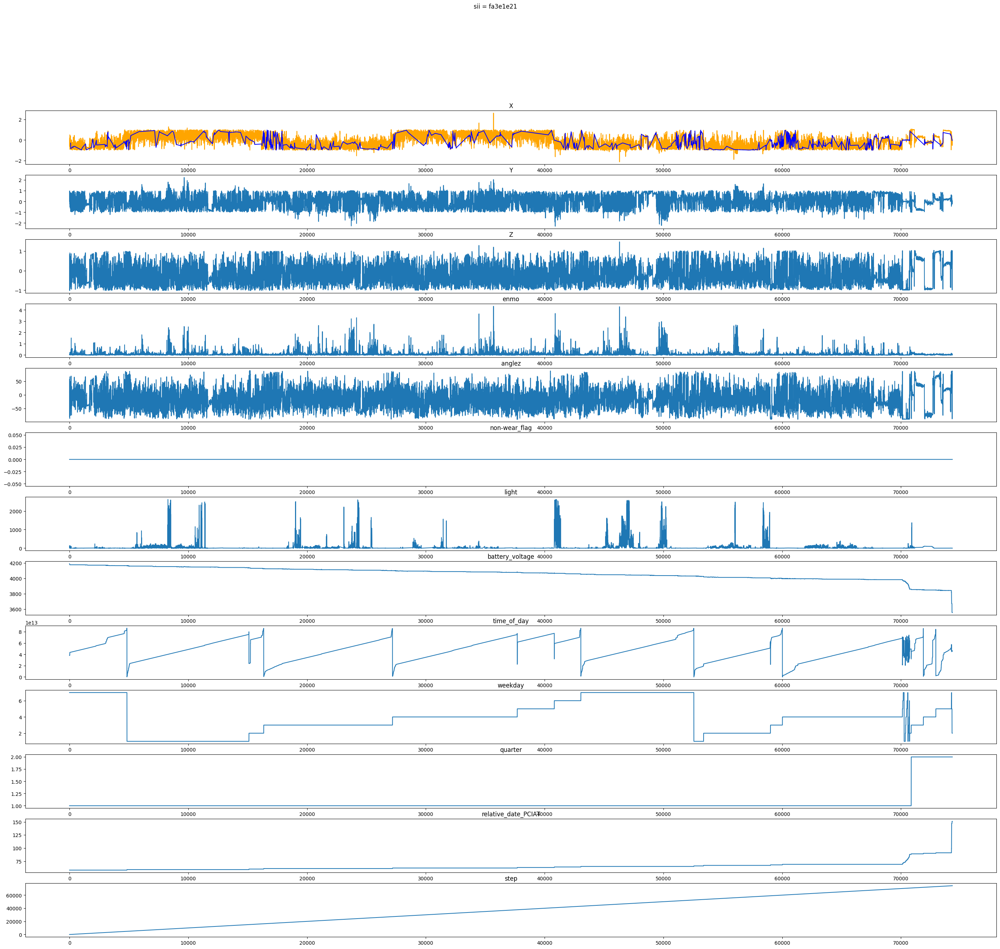

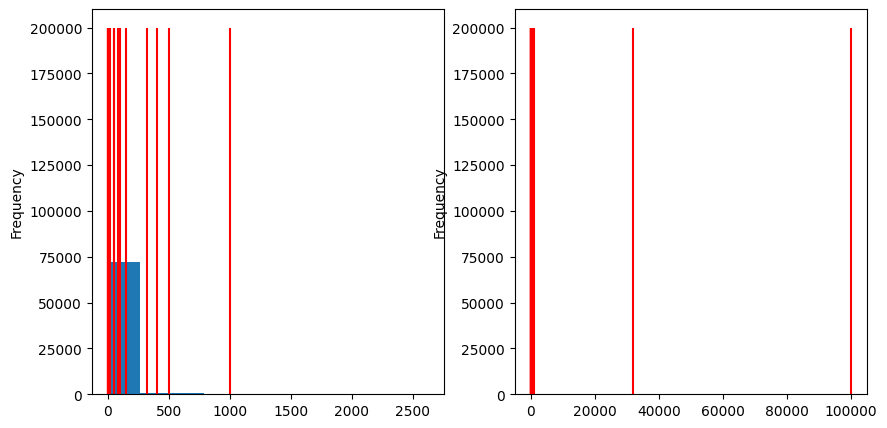

In [136]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 3.170222
sii 0.0


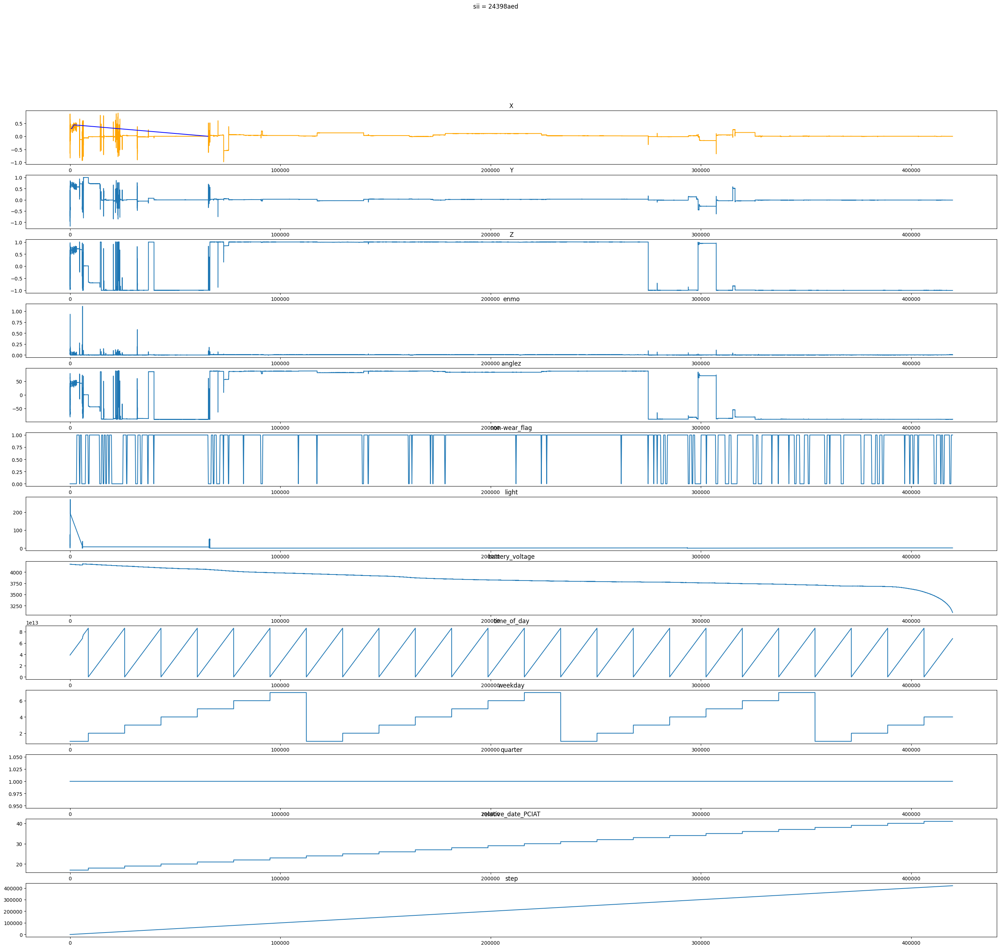

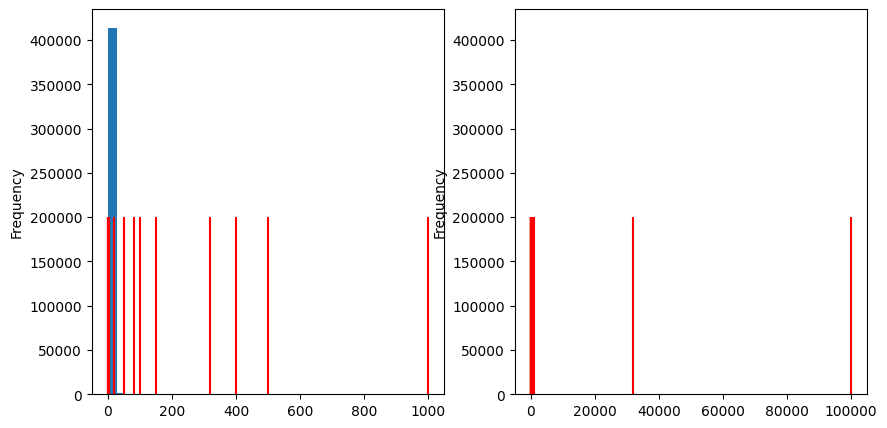

In [137]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 12.636025
sii 0.0


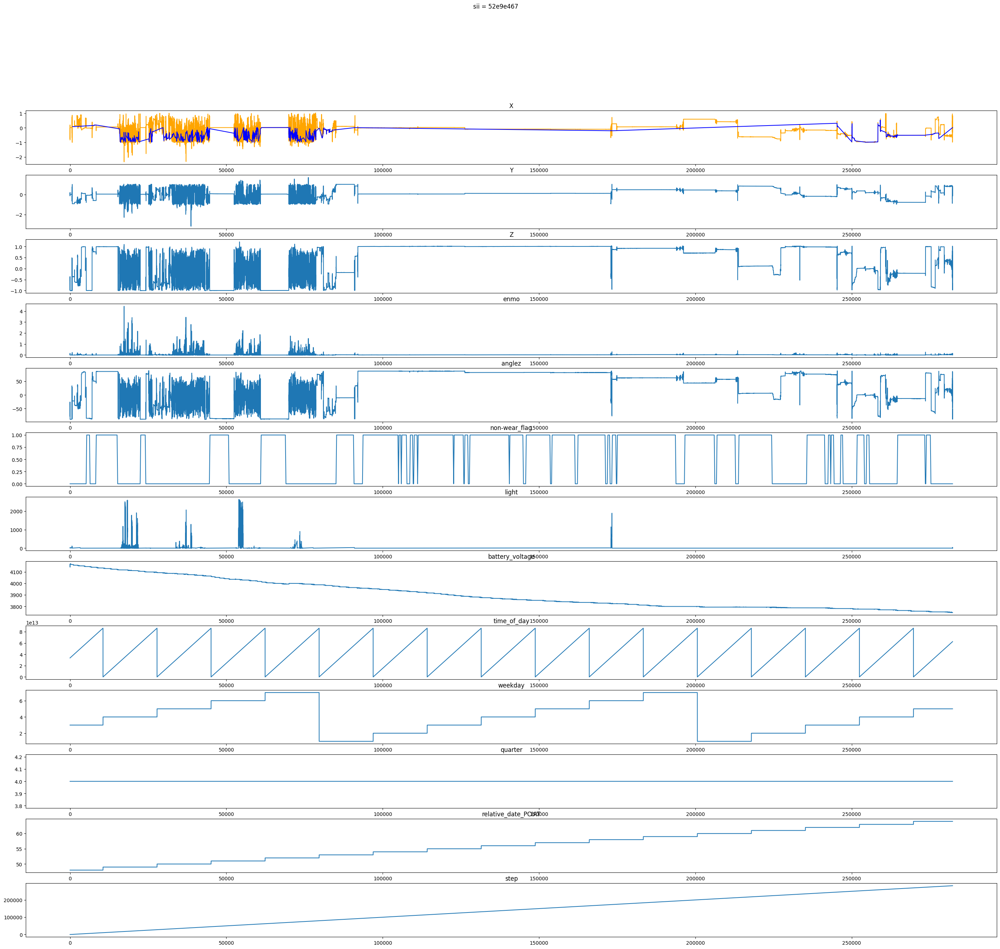

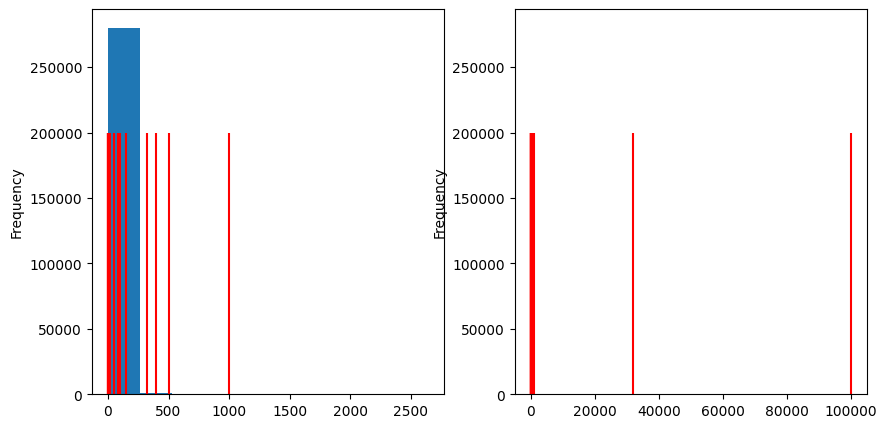

In [138]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 120.97862
sii 2.0


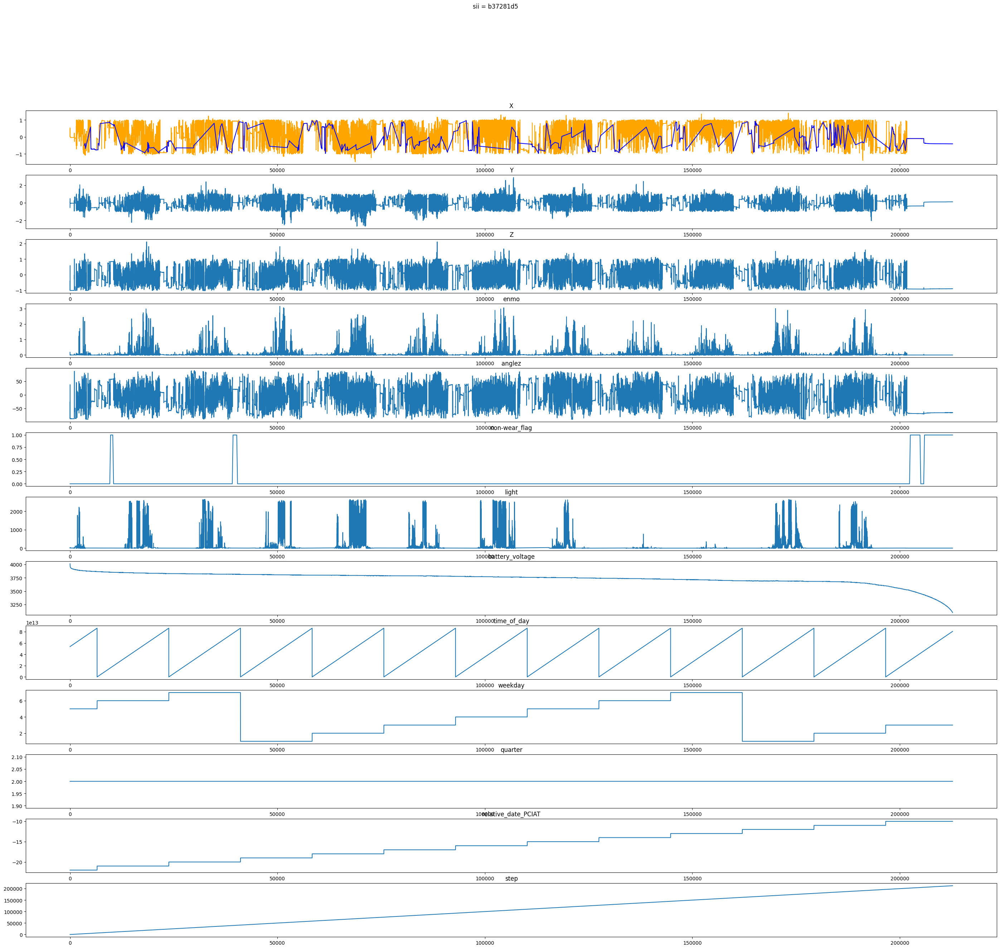

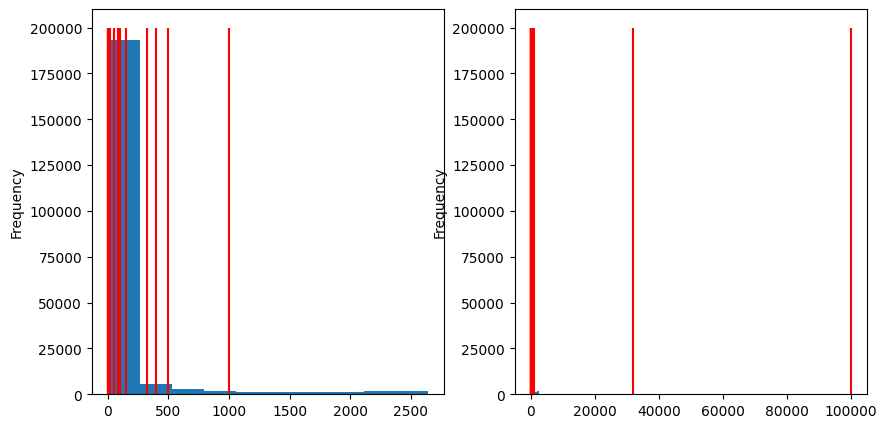

In [139]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 25.997513
sii 0.0


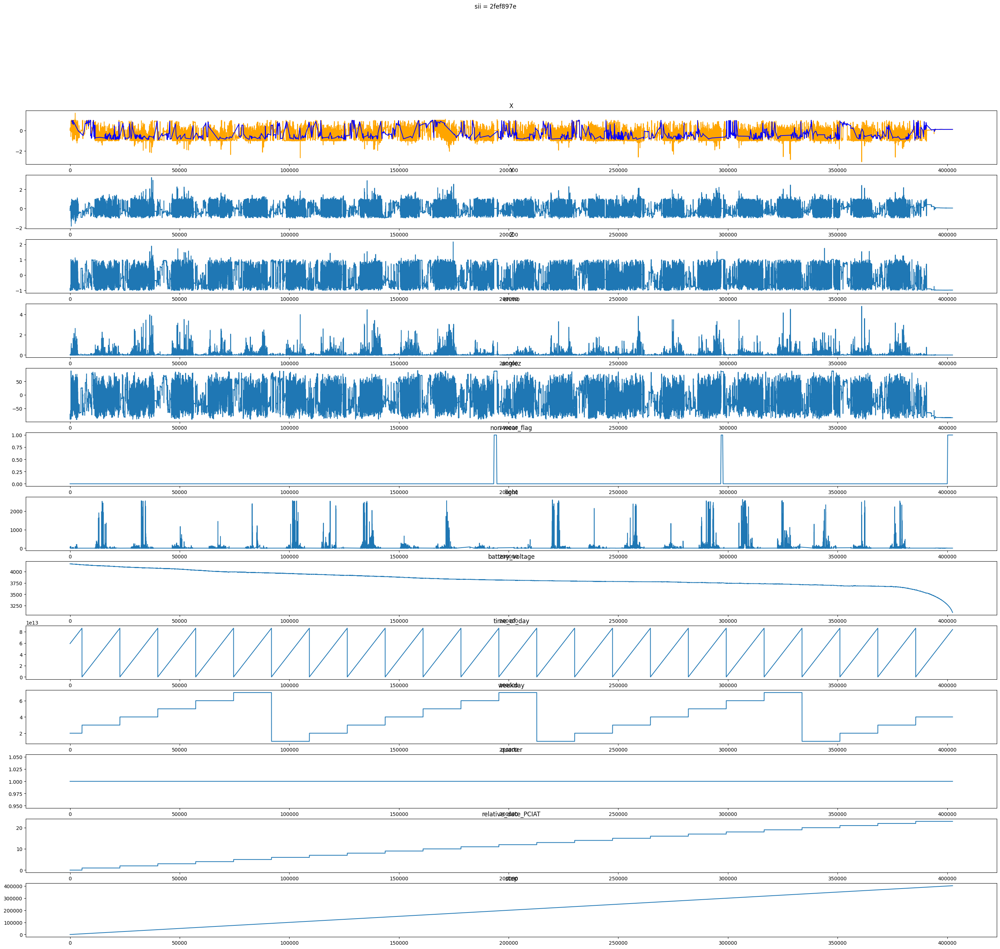

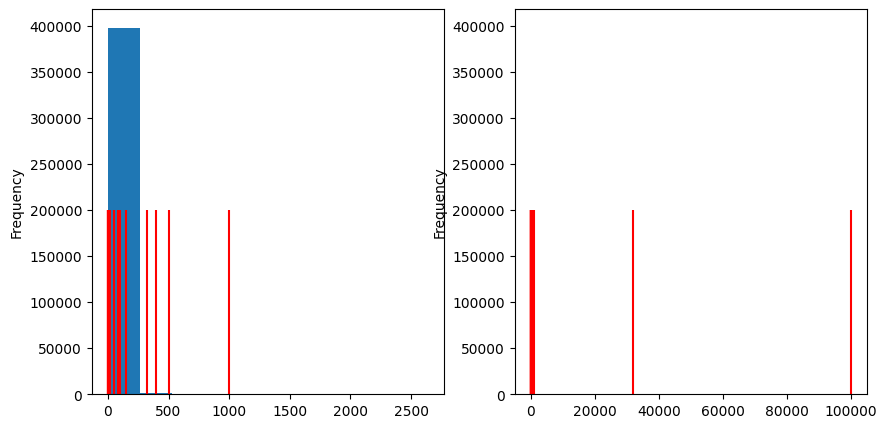

In [140]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 18.218454
sii 0.0


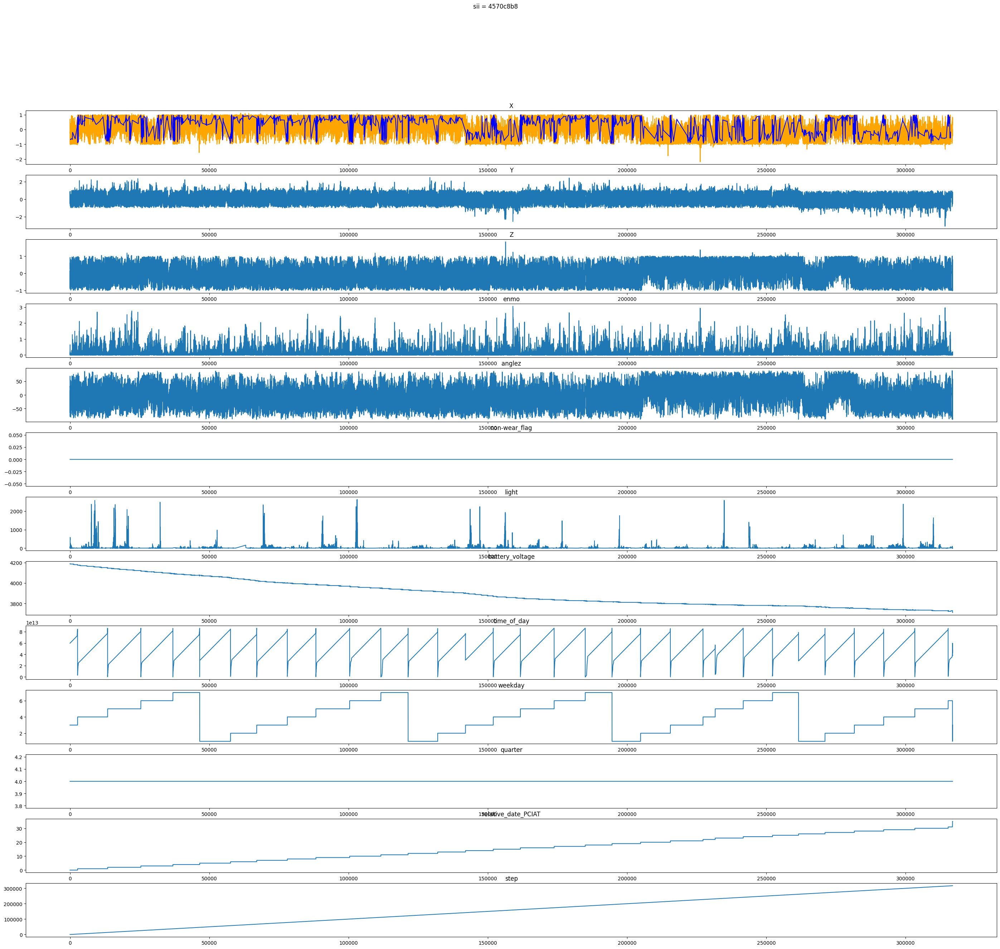

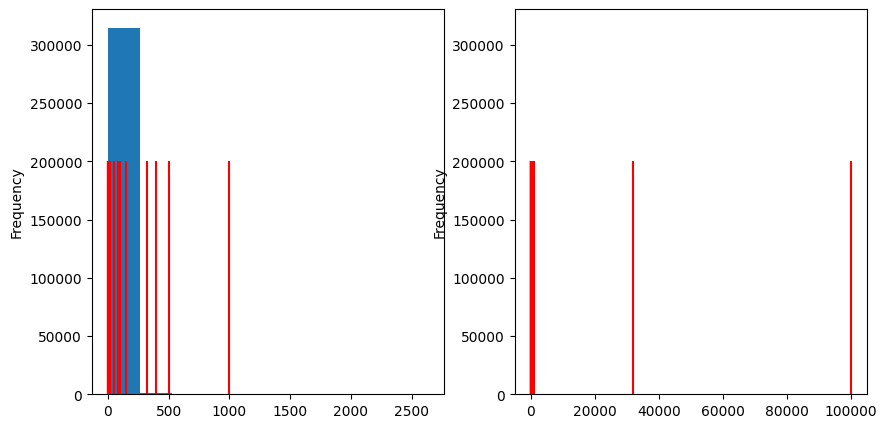

In [141]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

light mean 32.059376
sii 0.0


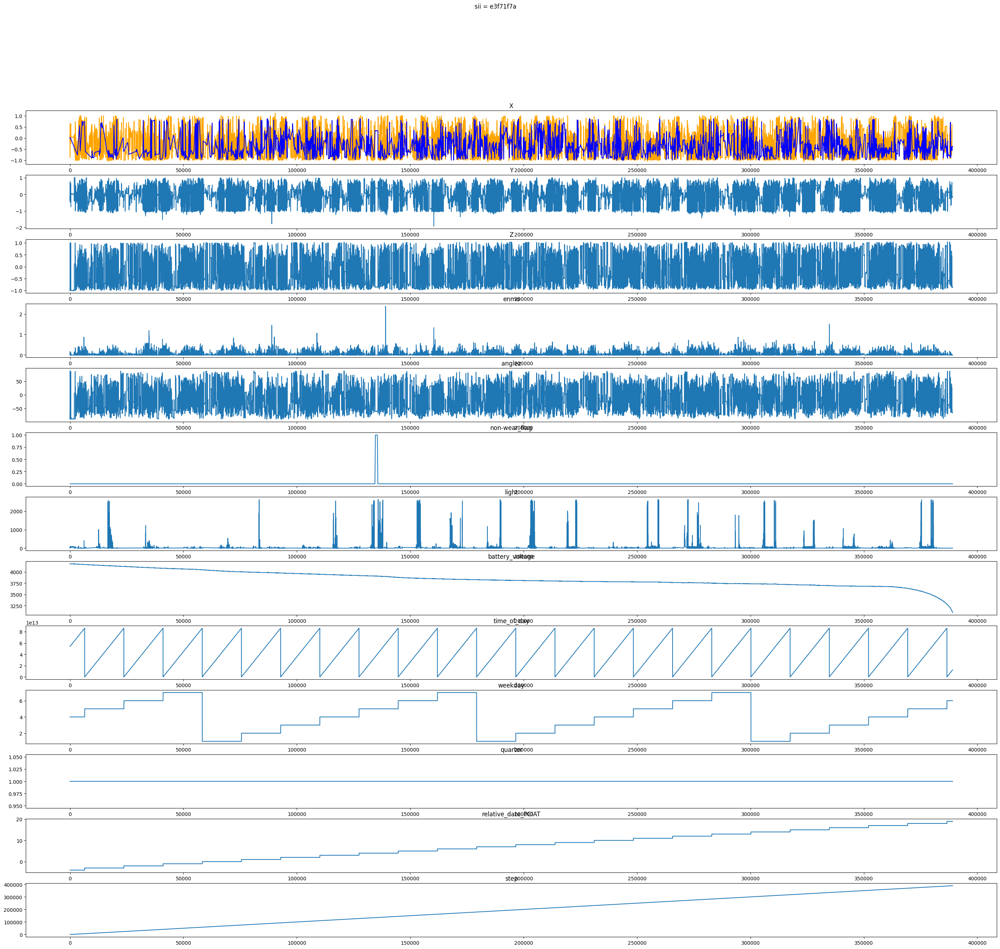

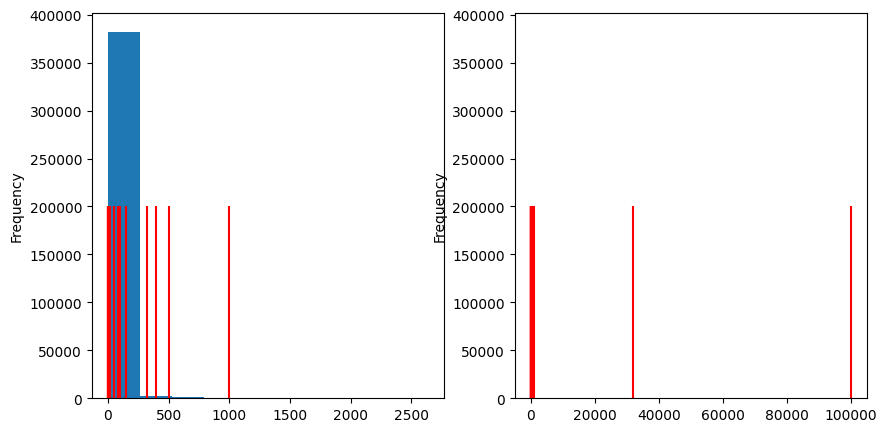

In [142]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

In [143]:
df

,id,Basic_Demos-Age,Basic_Demos-Sex,CGAS-CGAS_Score,Physical-BMI,Physical-Height,Physical-Weight,Physical-Waist_Circumference,Physical-Diastolic_BP,Physical-HeartRate,...,PCIAT-PCIAT_Total,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-computerinternet_hoursday,sii,parquet_data_exist,file_num,file_of_length,non-wear_length,percent_non-wear_length
0,00115b9f,9,0,71.0,18.292347,56.00,81.6,NaN,60.0,97.0,...,44.0,31.0,45.0,0.0,1.0,True,1,43330,0,0.000000
1,001f3379,13,1,50.0,22.279952,59.50,112.2,NaN,60.0,73.0,...,34.0,40.0,56.0,0.0,1.0,True,1,396396,252760,0.637645
2,00f332d1,14,0,68.0,17.168636,66.50,108.0,NaN,60.0,71.0,...,47.0,30.0,43.0,2.0,1.0,True,1,414384,68545,0.165414
3,01085eb3,12,0,58.0,34.187282,60.50,178.0,NaN,67.0,81.0,...,30.0,53.0,73.0,0.0,0.0,True,1,370956,12793,0.034487
4,012cadd8,9,0,60.0,17.089151,53.20,68.8,NaN,62.0,88.0,...,9.0,27.0,40.0,0.0,0.0,True,1,97048,0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
991,fe9c71d8,9,0,80.0,15.891137,56.75,72.8,NaN,44.0,65.0,...,29.0,33.0,47.0,0.0,0.0,True,1,426684,55612,0.130335
992,fecc07d6,7,0,85.0,15.986589,49.00,54.6,NaN,59.0,80.0,...,14.0,34.0,49.0,0.0,0.0,True,1,414300,384684,0.928516
993,ff18b749,7,0,NaN,14.768842,47.50,47.4,NaN,58.0,99.0,...,0.0,62.0,85.0,0.0,0.0,True,1,384900,0,0.000000
994,ffcd4dbd,11,0,68.0,21.441500,60.00,109.8,NaN,79.0,99.0,...,31.0,56.0,77.0,0.0,1.0,True,1,416275,7744,0.018603


In [144]:
df["sii"].value_counts()

sii
0.0    583
1.0    266
2.0    137
3.0     10
Name: count, dtype: int64

In [146]:
train_df = pd.read_csv("../input/train.csv")
train_df["sii"].value_counts()

sii
0.0    1594
1.0     730
2.0     378
3.0      34
Name: count, dtype: int64

In [152]:
sample.light.value_counts().sort_index()

light
0.000000       1957
0.000821          1
0.000918          1
0.001048          1
0.001346          1
               ... 
2628.000000       1
2629.750000       1
2634.000000       1
2635.000000       2
2637.600098       1
Name: count, Length: 287800, dtype: int64

人間が決めたルクスを特徴量にする

In [156]:
partitions = [
    0.0001,
    0.002,
    0.05, #Full moon on a clear night[6]
    0.3,  #Full moon on a clear night[6]
    3.4,  #Dark limit of civil twilight under a clear sky[7]
    20, #Public areas with dark surroundings[8]
    #50, #Public areas with dark surroundings[8]
    50, #Family living room lights (Australia, 1998)[9]
    80, #Office building hallway/toilet lighting[10][11]
    100, #Very dark overcast day[5]
    150, #Train station platforms[12]
    320, #Office lighting[9][13][14][15]
    400, #Sunrise or sunset on a clear day.
    500, #Office lighting[9][13][14][15]
    1000, #Overcast day;[5] typical TV studio lighting
    10_000, #Full daylight (not direct sun)[5]
    25_000, #Full daylight (not direct sun)[5]
    32_000,
    100_000 #Direct sunlight
]

In [158]:
sorted(partitions), len(partitions)

([0.0001,
  0.002,
  0.05,
  0.3,
  3.4,
  20,
  50,
  80,
  100,
  150,
  320,
  400,
  500,
  1000,
  10000,
  25000,
  32000,
  100000],
 18)

In [175]:
def lux_category(lux_value):
    """
    Illuminance (lux) Surfaces illuminated by
    0.0001 Moonless, overcast night sky (starlight)[5]
    0.002 Moonless clear night sky with airglow[5]
    0.05–0.3 Full moon on a clear night[6]
    3.4 Dark limit of civil twilight under a clear sky[7]
    20–50 Public areas with dark surroundings[8]
    50 Family living room lights (Australia, 1998)[9]
    80 Office building hallway/toilet lighting[10][11]
    100 Very dark overcast day[5]
    150 Train station platforms[12]
    320–500 Office lighting[9][13][14][15]
    400 Sunrise or sunset on a clear day.
    1000 Overcast day;[5] typical TV studio lighting
    10,000–25,000 Full daylight (not direct sun)[5]
    32,000–100,000 Direct sunlight
    """
    partitions = [
    0.0001,
    0.002,
    0.05, #Full moon on a clear night[6]
    0.3,  #Full moon on a clear night[6]
    3.4,  #Dark limit of civil twilight under a clear sky[7]
    20, #Public areas with dark surroundings[8]
    #50, #Public areas with dark surroundings[8]
    50, #Family living room lights (Australia, 1998)[9]
    80, #Office building hallway/toilet lighting[10][11]
    100, #Very dark overcast day[5]
    150, #Train station platforms[12]
    320, #Office lighting[9][13][14][15]
    400, #Sunrise or sunset on a clear day.
    500, #Office lighting[9][13][14][15]
    1000, #Overcast day;[5] typical TV studio lighting
    10_000, #Full daylight (not direct sun)[5]
    25_000, #Full daylight (not direct sun)[5]
    32_000,
    100_000 #Direct sunlight
    ]
    for i, p in enumerate(partitions):
        if lux_value <= p:
            return i
    return len(partitions)

In [176]:
lux_data = pd.DataFrame({"lux":partitions+[1000_000]})
lux_data["category"] = lux_data.lux.apply(lambda x: lux_category(x))
lux_data

,lux,category
0,0.0001,0
1,0.0020,1
2,0.0500,2
3,0.3000,3
4,3.4000,4
5,20.0000,5
6,50.0000,6
7,80.0000,7
8,100.0000,8
9,150.0000,9


In [179]:
sample["lux_category"] = sample["light"].apply(lambda x: lux_category(x))

In [183]:
def plot_xyz(sample, title):
    fig, ax = plt.subplots(14, 1, figsize=(35, 30))

    enmo_non_zero = sample[sample["enmo"]!=0]
    ax[0].plot(enmo_non_zero["step"], enmo_non_zero["X"], color="orange")
    enmo_zero = sample[sample["enmo"]==0]
    ax[0].plot(enmo_zero["step"], enmo_zero["X"], color="blue")
    ax[0].set_title("X")
    
    ax[1].plot(sample["Y"])
    ax[1].set_title("Y")
    
    ax[2].plot(sample["Z"])
    ax[2].set_title("Z")

    ax[3].plot(sample["enmo"])
    ax[3].set_title("enmo")

    ax[4].plot(sample["anglez"])
    ax[4].set_title("anglez")

    ax[5].plot(sample["non-wear_flag"])
    ax[5].set_title("non-wear_flag")
    
    ax[6].plot(sample["light"])
    ax[6].set_title("light")

    ax[7].plot(sample["lux_category"])
    ax[7].set_title("lux_category")
    
    ax[8].plot(sample["battery_voltage"])
    ax[8].set_title("battery_voltage")

    ax[9].plot(sample["time_of_day"])
    ax[9].set_title("time_of_day")

    ax[10].plot(sample["weekday"])
    ax[10].set_title("weekday")

    ax[11].plot(sample["quarter"])
    ax[11].set_title("quarter")

    ax[12].plot(sample["relative_date_PCIAT"])
    ax[12].set_title("relative_date_PCIAT")

    ax[13].plot(sample["step"])
    ax[13].set_title("step")

    fig.suptitle(title)
    plt.show()

In [184]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT,lux_category
0,0,-0.006597,0.005499,-1.012629,0.012674,-89.429268,0.0,29.500000,4186.000000,48480000000000,5,3,84.0,6
1,1,-0.006350,0.005329,-1.009202,0.009243,-89.427078,0.0,29.333334,4185.750000,48485000000000,5,3,84.0,6
2,2,-0.006311,0.005329,-1.007456,0.007497,-89.426964,0.0,30.000000,4185.500000,48490000000000,5,3,84.0,6
3,3,-0.006285,0.005290,-1.006518,0.006560,-89.436127,0.0,30.250000,4185.250000,48495000000000,5,3,84.0,6
4,4,-0.006324,0.005407,-1.006271,0.006312,-89.433922,0.0,30.500000,4185.000000,48500000000000,5,3,84.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
403855,403855,-0.625590,-0.085501,-0.763771,0.000000,-50.331715,1.0,11.333333,3098.833252,80555000000000,7,3,107.0,5
403856,403856,-0.625564,-0.085567,-0.763693,0.000000,-50.313705,1.0,11.333333,3098.666748,80560000000000,7,3,107.0,5
403857,403857,-0.625642,-0.085175,-0.763836,0.000000,-50.317947,1.0,11.333333,3098.500000,80565000000000,7,3,107.0,5
403858,403858,-0.625499,-0.085449,-0.763510,0.000000,-50.346863,1.0,11.333333,3098.333252,80570000000000,7,3,107.0,5


light mean 30.153046
sii 1.0


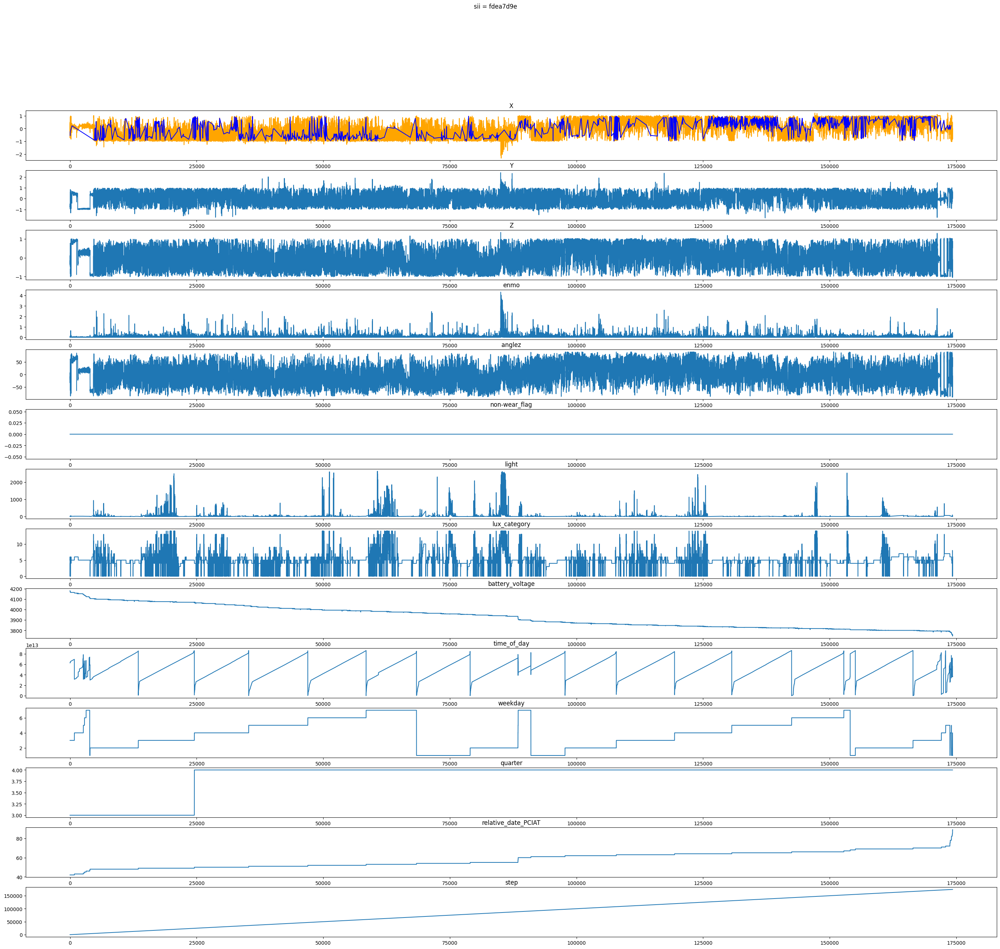

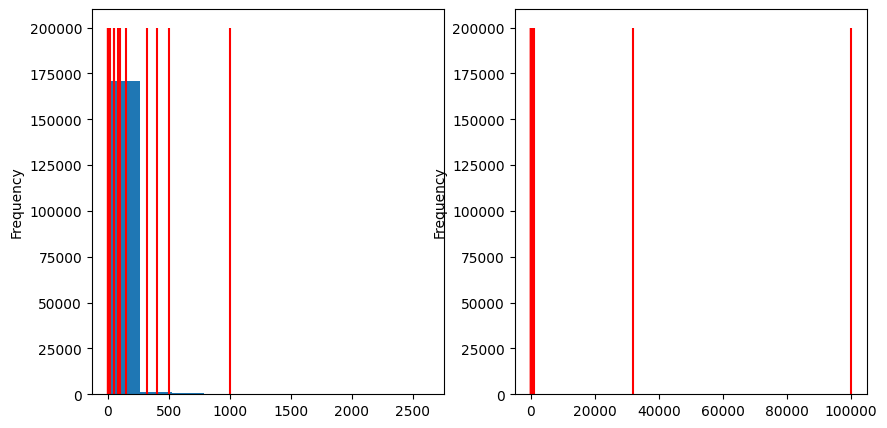

In [185]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

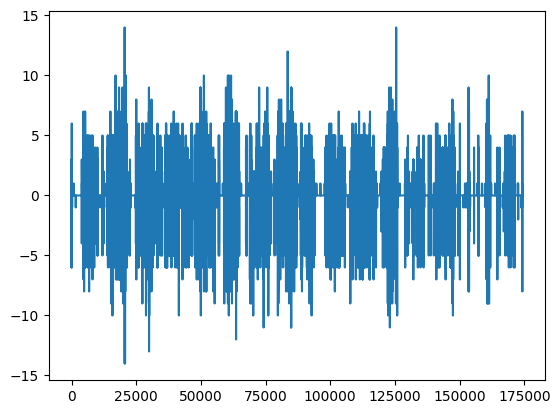

In [188]:
plt.plot(sample["lux_category"].diff().fillna(0))

In [192]:
sample

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT,lux_category
0,0,0.385512,-0.766145,-0.230374,0.032613,-19.080587,0.0,12.333333,4180.000000,62760000000000,3,3,42.0,5
1,1,0.274442,-0.475011,-0.400339,0.038266,-33.730679,0.0,17.666666,4179.583496,62765000000000,3,3,42.0,5
2,2,0.514398,-0.770256,0.119095,0.063487,7.456691,0.0,23.000000,4179.166504,62770000000000,3,3,42.0,6
3,3,0.410570,-0.603427,-0.137964,0.084179,-9.827575,0.0,0.000000,4178.750000,62775000000000,3,3,42.0,0
4,4,-0.727319,-0.584183,-0.272513,0.020658,-16.570028,0.0,0.200000,4178.333496,62780000000000,3,3,42.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
174273,174273,-0.823828,0.045027,-0.187635,0.045293,-17.216621,0.0,29.000000,3755.166748,36815000000000,1,4,89.0,6
174274,174274,-0.472828,0.334337,0.608559,0.035889,40.316353,0.0,29.000000,3756.333252,36820000000000,1,4,89.0,6
174275,174275,-0.205652,0.195849,0.881359,0.028166,67.728874,0.0,29.000000,3757.500000,36825000000000,1,4,89.0,6
174276,174276,-0.445973,0.317508,0.637982,0.063810,46.860504,0.0,29.000000,3758.666748,36830000000000,1,4,89.0,6


In [197]:
sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))

true_sample = sample[sample["non-wear_flag"] == 0]

true_sample.groupby("lux_category")["enmo"].agg({"mean", "median", "min", "max", "var"}).add_suffix("_enmo").reset_index(drop=False)

,lux_category,max_enmo,median_enmo,mean_enmo,var_enmo,min_enmo
0,0,1.980162,0.046282,0.078694,0.016104,0.000000
1,1,0.921600,0.047962,0.102078,0.044980,0.002962
2,2,1.313200,0.041109,0.078096,0.013938,0.000000
3,3,1.280797,0.020932,0.049366,0.007234,0.000000
4,4,2.317831,0.020067,0.046915,0.008615,0.000000
5,5,2.771249,0.018893,0.044521,0.008675,0.000000
6,6,3.149802,0.024305,0.053346,0.010046,0.000000
7,7,1.726489,0.020802,0.048496,0.008983,0.000000
8,8,1.750004,0.027043,0.067512,0.017825,0.000000
9,9,3.031605,0.037063,0.078737,0.027818,0.000000


light mean 86.01404
sii 2.0


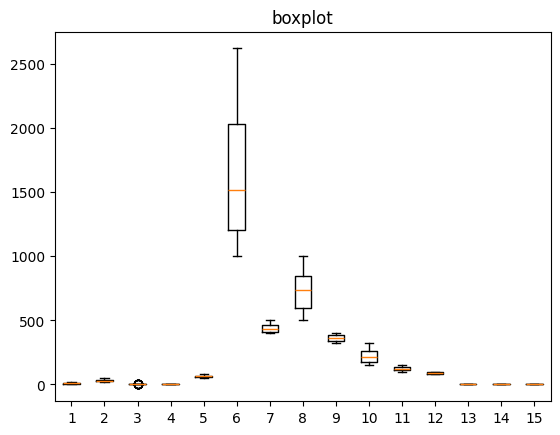

In [199]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 0.5889814
sii 2.0


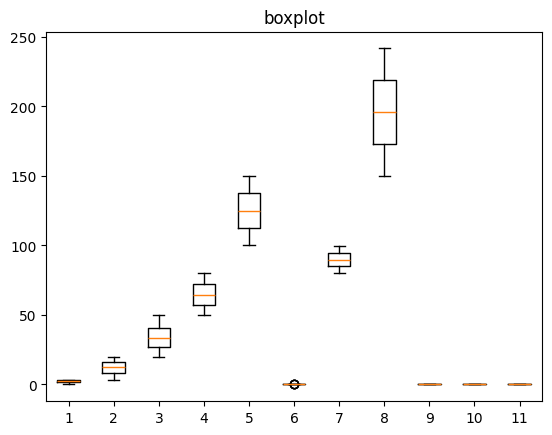

In [200]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 17.66322
sii 0.0


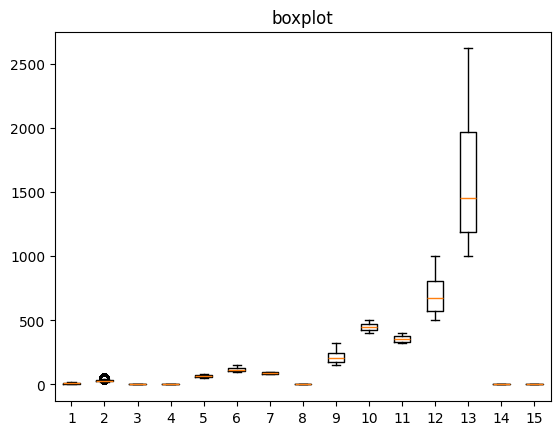

In [201]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 20.478127
sii 0.0


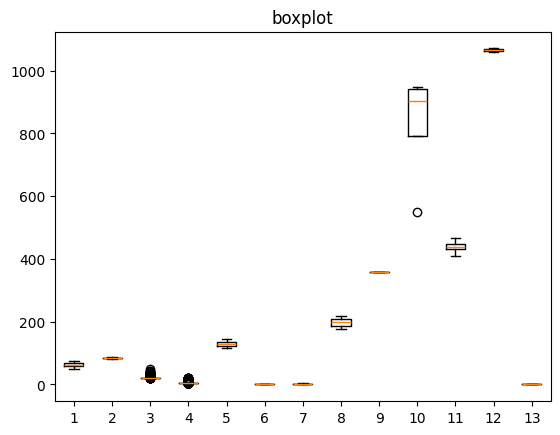

In [202]:
_id = df.sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 26.649622
sii 2.0


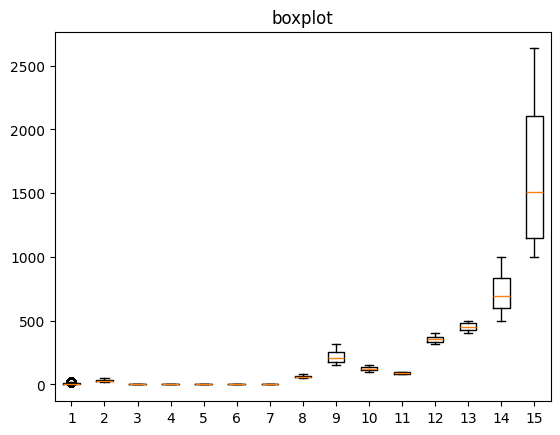

In [204]:
_id = df[df["sii"]==2].sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 14.148538
sii 3.0


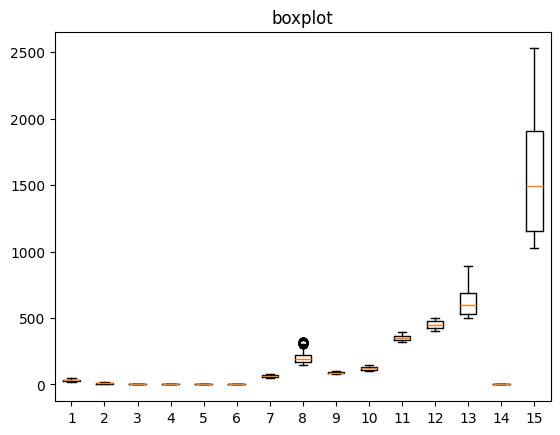

In [206]:
_id = df[df["sii"]==3].sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

light mean 25.377674
sii 1.0


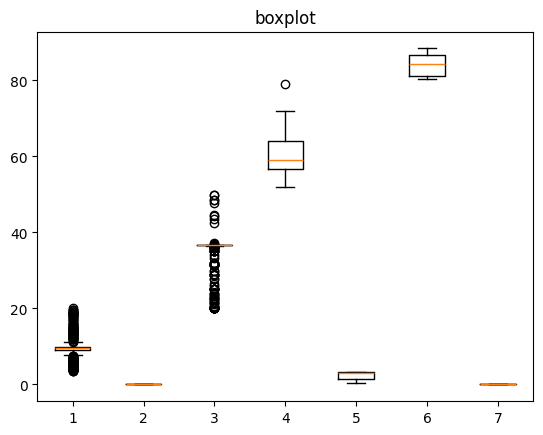

In [211]:
_id = df[df["sii"]==1].sample(1)["id"].values[0]
sample = pd.read_parquet(parq_dir / f"id={_id}/part-0.parquet")

sample["lux_category"] = sample.light.apply(lambda x: lux_category(x))
print("light mean", sample["light"].mean())
print("sii", df[df["id"]==_id]["sii"].values[0])

true_sample = sample[sample["non-wear_flag"] == 0]
cat = true_sample["lux_category"].unique()
boxes = []
for i in cat:
    box = true_sample[true_sample["lux_category"] == i].light.values
    boxes.append(box) 
    
plt.boxplot(boxes)
plt.title('boxplot')
plt.show()

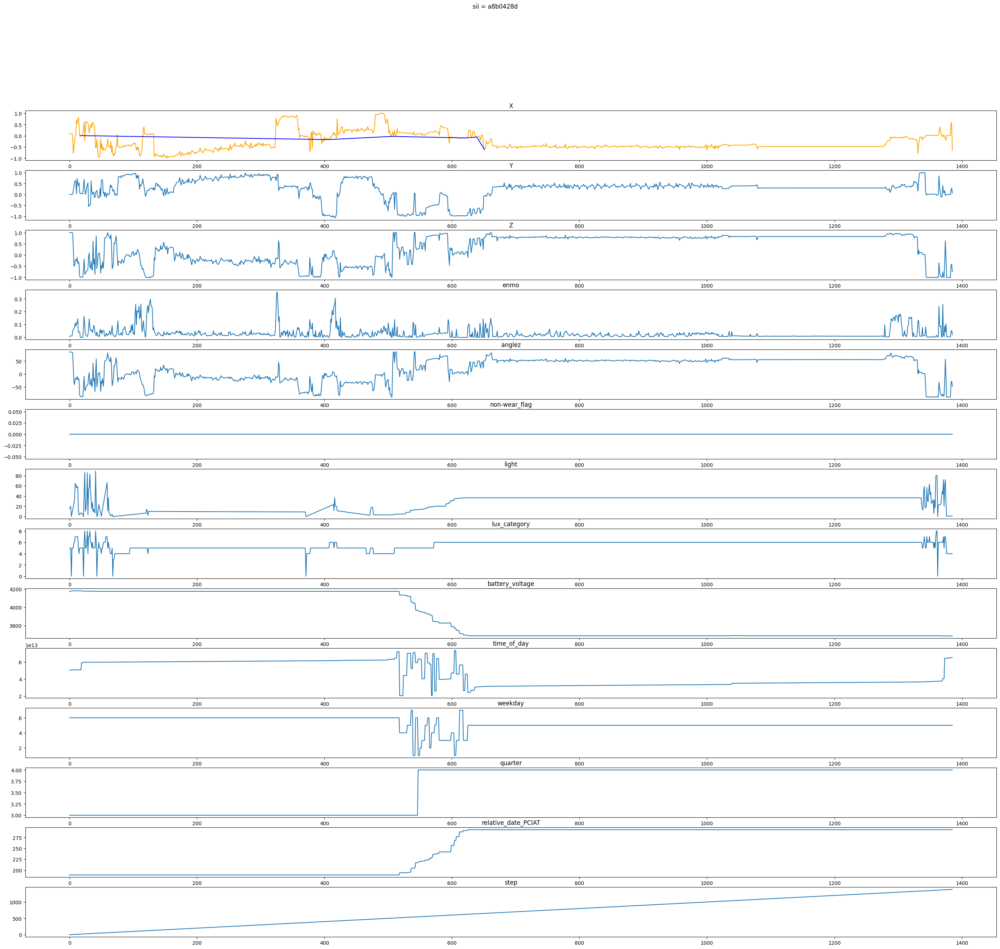

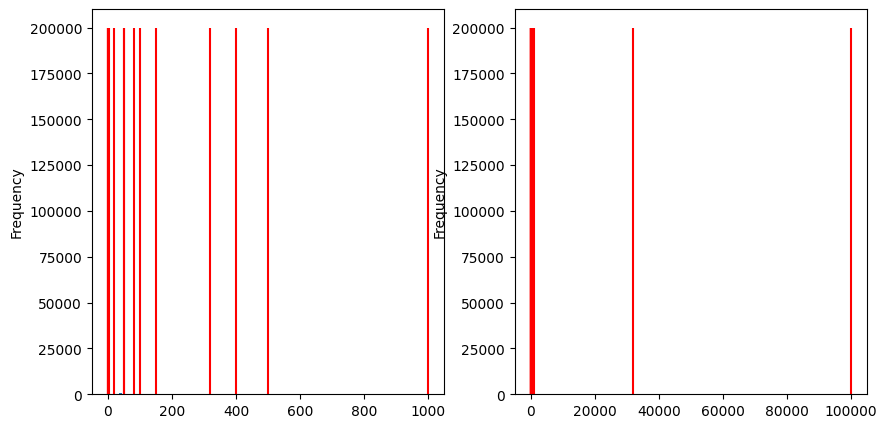

In [212]:
plot_xyz(sample=sample, title=f"sii = {_id}")
plot_lux_line(sample)

In [215]:
df.columns

Index(['id', 'Basic_Demos-Age', 'Basic_Demos-Sex', 'CGAS-CGAS_Score',
       'Physical-BMI', 'Physical-Height', 'Physical-Weight',
       'Physical-Waist_Circumference', 'Physical-Diastolic_BP',
       'Physical-HeartRate', 'Physical-Systolic_BP',
       'Fitness_Endurance-Max_Stage', 'Fitness_Endurance-Time_Mins',
       'Fitness_Endurance-Time_Sec', 'FGC-FGC_CU', 'FGC-FGC_CU_Zone',
       'FGC-FGC_GSND', 'FGC-FGC_GSND_Zone', 'FGC-FGC_GSD', 'FGC-FGC_GSD_Zone',
       'FGC-FGC_PU', 'FGC-FGC_PU_Zone', 'FGC-FGC_SRL', 'FGC-FGC_SRL_Zone',
       'FGC-FGC_SRR', 'FGC-FGC_SRR_Zone', 'FGC-FGC_TL', 'FGC-FGC_TL_Zone',
       'BIA-BIA_Activity_Level_num', 'BIA-BIA_BMC', 'BIA-BIA_BMI',
       'BIA-BIA_BMR', 'BIA-BIA_DEE', 'BIA-BIA_ECW', 'BIA-BIA_FFM',
       'BIA-BIA_FFMI', 'BIA-BIA_FMI', 'BIA-BIA_Fat', 'BIA-BIA_Frame_num',
       'BIA-BIA_ICW', 'BIA-BIA_LDM', 'BIA-BIA_LST', 'BIA-BIA_SMM',
       'BIA-BIA_TBW', 'PAQ_A-PAQ_A_Total', 'PAQ_C-PAQ_C_Total',
       'PCIAT-PCIAT_01', 'PCIAT-PCIAT_02', 'P